In [1]:
suppressWarnings(suppressPackageStartupMessages({
    library(Seurat)
    library(Signac)
    library(EnsDb.Hsapiens.v86)
    library(dplyr)
    library(ggplot2)
    library(bedr)
    library(SeuratDisk)
    library(scales)
    library(reshape2)
    library(Hmisc)
    library(tidyr)
    library(tidyverse)
    library(crayon)
    library(readr)
    library(future)
    library(combinat)
    library("TxDb.Hsapiens.UCSC.hg38.knownGene")
    library(GenomicRanges)
    library(GenomicFeatures)
    library(rsnps)
    library(biomaRt)
    library(ggpubr)
    library(gridExtra)
    library(patchwork)
    library(EnhancedVolcano)
    library(rlist)
    library(purrr)
}))
options(timeout=1000)
source('/home/vsevim/prj/workflows/ckd/secondary/helper_functions_for_diffex.r')

# Definitions etc

In [2]:
set.seed(1234)
options(digits=2)
stats <- c()

In [3]:
options(future.globals.maxSize= 250 * 1024^3) # 650Gb
# plan()

# Enable parallelization
plan(sequential)
plan("multicore", workers = 64)

In [4]:
if(!exists("papermill_run")) {
    prj_name = "Screen1_66guides"
    data_subdir_suffixes = "L1,L2,L3,L4"     
    secondary_a_path = "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/"
    save_seurat_h5 = "YES"
}

In [5]:
custom_theme <- theme(
  plot.title = element_text(size=16, hjust = 0.5), 
  legend.key.size = unit(0.7, "cm"), 
  legend.text = element_text(size = 14))

### Load guide df

In [6]:
df_guide = read.table("/home/vsevim/prj/1012-ckd/S1/scripts/library_csv/66CRISPRi_ref_for_diffex.txt", sep = "\t", header = T, strip.white = T)
head(df_guide)

,gene,guide1,guide2,alias,subclass,class,gene_or_rsid,label
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,CD13,CD13-1a,CD13-1b,ANPEP,tss,targeting,ANPEP,Control TSS
2,CD55,CD55-1a,CD55-1b,CD55,tss,targeting,CD55,Control TSS
3,CD73,CD73-1a,CD73-1b,NT5E,tss,targeting,NT5E,Control TSS
4,FUBP1,FUBP1-1a,FUBP1-1b,FUBP1,tss,targeting,FUBP1,Control TSS
5,C15orf40,C15orf40-1a,C15orf40-1b,C15orf40,tss,targeting,C15orf40,Control TSS
6,MAFF,MAFF-1a,MAFF-1b,MAFF,tss,targeting,MAFF,Control TSS


### Load Seurat file

In [7]:
integrated_h5_path <- "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/integrated/seurat_objects/integrated.h5seurat"
seurat_combined    <- LoadH5Seurat(integrated_h5_path, verbose = F)
#seurat_combined    <- subset(seurat_combined, subset=status=='singlet')

Validating h5Seurat file



Normalize RNA counts by <font color='red'>NormalizeData</font>  before running FindMarkers

In [ ]:
seurat_rna = CreateSeuratObject(seurat_combined[['RNA']])
seurat_rna <- NormalizeData(seurat_rna)
seurat_rna@meta.data <- seurat_combined@meta.data

### Load THRESHOLDS.tsv

In [ ]:
thr_f_name = paste0(secondary_a_path, "/integrated/THRESHOLDS.tsv")
df_thresholds = read.table(thr_f_name, header=T, strip.white = T)
df_thresholds <- df_thresholds %>% pivot_wider(names_from = batch, values_from = threshold)
df_thresholds <- as.data.frame(df_thresholds)

## FeaturePlot singlet & doublet

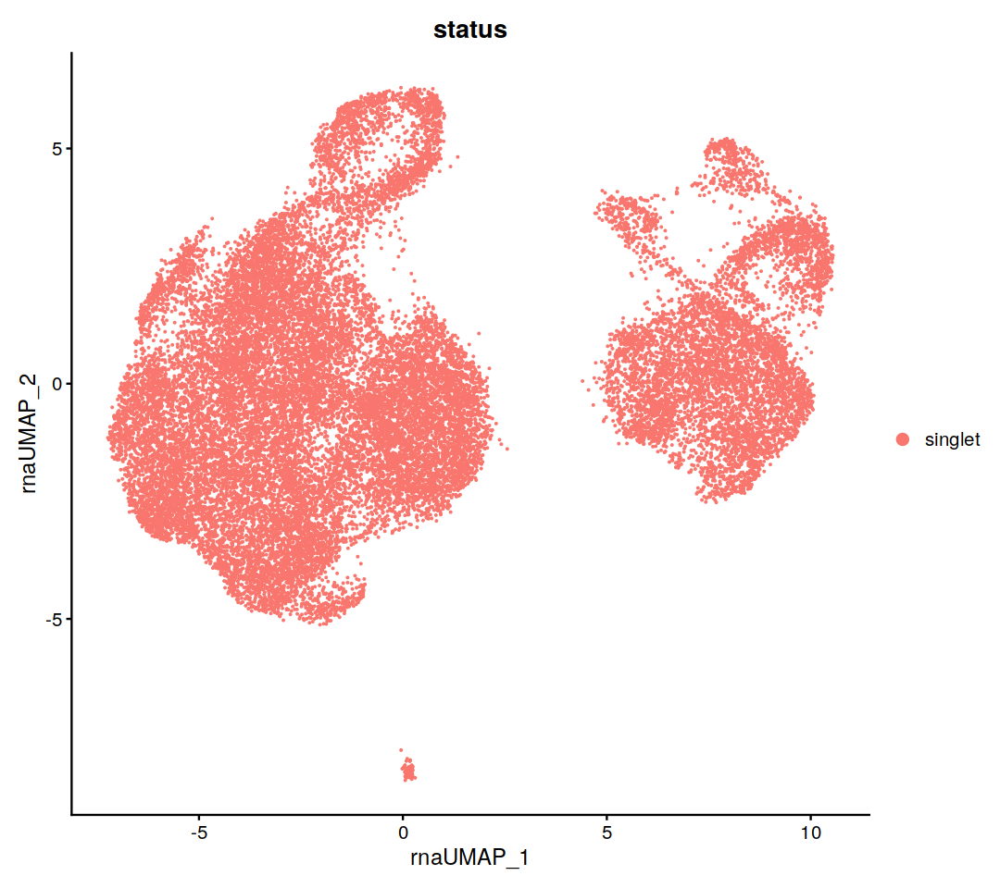

In [ ]:
options(repr.plot.width=9, repr.plot.height=8)
DimPlot(seurat_combined, group.by='status')

# Differential expression

## Select perturbed/control cells
Find guide+ (perturbed) and guide- (unperturbed) cells for each guide

In [ ]:
libraries = unique(seurat_combined$library)
seurat_libs = list()
for(i in seq_along(libraries)){ 
    lib = libraries[i]
    seurat_libs[[i]] = subset(seurat_combined, subset = library == lib)
}
names(seurat_libs) <- libraries

In [ ]:
perturbed_cells_by_guide = list()

for(i in 1:nrow(df_thresholds)){  
    perturbed_cells_in_all_libs = list()
    guide = df_thresholds$guide[i]
    # Loop over libraries
    for(lib in libraries){        
        seurat_lib = seurat_libs[[lib]]
        threshold = df_thresholds[i, lib]        
        #cat(blue(guide, lib, threshold, "\n"))
        cells_in_lib = Cells(seurat_lib)        
        sgrna_counts = seurat_lib[['sgRNA']]@counts
        select_perturbed = sgrna_counts[guide, cells_in_lib] >= threshold
        perturbed_cells_in_library = cells_in_lib[select_perturbed]
        #cat(length(cells_in_lib), "in", lib, guide, length(perturbed_cells_in_library), "cells >", threshold, "\n")        
        if(!is.na(threshold)) {
            perturbed_cells_in_all_libs = append(perturbed_cells_in_all_libs, perturbed_cells_in_library)
        }
    }
    perturbed_cells_by_guide[[i]] = perturbed_cells_in_all_libs
}
names(perturbed_cells_by_guide) <- df_thresholds$guide

In [ ]:
length(perturbed_cells_by_guide[[3]])

[1] 799

In [ ]:
df_thresholds$guide[grepl("NT" , df_thresholds$guide)]

[1] "NTCE1-1a" "NTCE3-1a" "NTCE3-1b" "NTCE4-1a" "NTCE4-1b"

## Helper functions (Just source helper_functions_for_diffex.r instead)

Mark cells that are positive for given guides as guide_positive, all others as guide_negative

In [ ]:
mark_guide_pos_neg <- function(seurat_obj, perturbed_cells_by_guide, guides, print_counts = T) {
    all_cells = Cells(seurat_obj)
    perturbed_cells = c()
    dummy_perturbed = c()
    
    for(guide in guides) {
        dummy_perturbed = unlist(perturbed_cells_by_guide[[guide]])
        perturbed_cells = union(perturbed_cells, dummy_perturbed)    
        #cat(guide," ", length(perturbed_cells), "\n")
    }

    unperturbed_cells = unlist(setdiff(all_cells, perturbed_cells))
    Idents(seurat_obj) <- "guide_negative"
    seurat_obj <- SetIdent(seurat_obj, cells = perturbed_cells, value = "guide_positive") 

    if(print_counts) {
        n_gplus   = length(perturbed_cells)
        n_gminus = length(unperturbed_cells)    
        cat(blue("Guide+ =",n_gplus, "; Guide- =", n_gminus, "\n"))
    }
    
    seurat_obj
}

Mark cells that are positive for given guides as 'guide_positive', unperturbed as 'unperturbed', all others as 'guide_negative'. The 'unperturbed' are the cells with either no guides at all or only positive for non-targeting guides. I wanted use them as a gold-standard set of controls, but their number is pretty low. 

In [ ]:
mark_pert_unpert <- function(seurat_obj, perturbed_cells_by_guide, df_guides, guides, print_counts = F) {
    guide_classes = unique(filter(df_guide, guide1 %in% guides | guide2 %in% guides)$class)
    if('nt_ctrl' %in% guide_classes) {
        stop("You can't pass non-targeting guides to mark_pert_unpert()")
    }
    select_targeting_guides = df_guides$class == 'targeting'
    df_targeting  = df_guides[select_targeting_guides, ]
    targeting_guides = c(df_targeting$guide1, df_targeting$guide2)
    seurat_dummy <- mark_guide_pos_neg(seurat_obj, perturbed_cells_by_guide, targeting_guides, print_counts = F)
    unperturbed_cells <- Cells(subset(seurat_dummy, idents='guide_negative'))
    
    seurat_dummy <- mark_guide_pos_neg(seurat_obj, perturbed_cells_by_guide, guides, print_counts = F)
    seurat_dummy <- SetIdent(seurat_dummy, cells = unperturbed_cells, value = "unperturbed")
    if(print_counts) {
        n_unpert = length(Cells(subset(seurat_dummy, idents='unperturbed')))
        n_pert = length(Cells(subset(seurat_dummy, idents='guide_positive')))
        cat(blue("Guide+ =",n_pert, "; Unperturbed =", n_unpert, "\n"))
    }
    seurat_dummy
}

Mark two different set of guides, A and B

In [ ]:
mark_a_b <- function(seurat_obj, arg_perturbed_cells_by_guide, guides_a, guides_b) {
    all_cells = Cells(seurat_obj)
    a_cells = c()
    b_cells = c()
    dummy = c()
    
    Idents(seurat_obj) <- ""
    for(guide in guides_a) {
        dummy = unlist(arg_perturbed_cells_by_guide[[guide]])
        a_cells = union(a_cells, dummy)
    }

    dummy = c() 
    for(guide in guides_b) {
        dummy = unlist(arg_perturbed_cells_by_guide[[guide]])
        b_cells = union(b_cells, dummy)
    }

    # Discard overlapping cells
    overlapping_cells = intersect(a_cells, b_cells)
    a_cells = setdiff(a_cells, overlapping_cells)
    b_cells = setdiff(b_cells, overlapping_cells)
    
    n_a = length(a_cells)
    n_b = length(b_cells)
    cat(blue("A =", n_a, "; B =", n_b, "\n"))
    
    seurat_obj <- SetIdent(seurat_obj, cells = a_cells, value = "A") 
    seurat_obj <- SetIdent(seurat_obj, cells = b_cells, value = "B") 
    seurat_obj
}

Find guides that belong to a class/subclass

In [ ]:
get_guides_by_subclass <- function(df_guides, column, value) {
    # column variable can be either 'class' or 'subclass'
    select_subclass = df_guides[, column] == value
    df_subclass     = df_guides[select_subclass, ]
    subclass_guides = c(df_subclass$guide1, df_subclass$guide2)
    subclass_guides    
}

Produce Vlnplot for given targets

In [ ]:
vlnplot_for_targets <- function(seurat_obj, df_guide, perturbed_cells_by_guide, targets) {
    plt_list = list()
    for(i in seq_along(targets)) {
        target = targets[i]
        print(target)
        guides = get_guides_by_subclass(df_guide, 'alias', target)
        seurat_rna <- mark_guide_pos_neg(
            seurat_obj, 
            perturbed_cells_by_guide, 
            guides, 
            print_counts = T
        )

        options(repr.plot.width=5, repr.plot.height=4)
        plt <- VlnPlot(
            object = seurat_rna,
            features =  target, 
            idents = NULL, 
            pt.size = 0., 
            sort = F, 
            ncol = 1,    
        ) + theme(legend.position = 'none')
        plt_list[[i]] = plt
    }
    plt_list
}

Produce RidgePlot for given targets

In [ ]:
ridgeplot_for_targets <- function(seurat_obj, df_guide, perturbed_cells_by_guide, targets) {
    plt_list = list()
    for(i in seq_along(targets)) {
        target = targets[i]
        print(target)
        guides = get_guides_by_subclass(df_guide, 'alias', target)
        seurat_rna <- mark_guide_pos_neg(
            seurat_obj, 
            perturbed_cells_by_guide, 
            guides, 
            print_counts = T
        )

        options(repr.plot.width=20, repr.plot.height=4)
        plt <- RidgePlot(
            object = seurat_rna,
            features =  targets, 
            idents = NULL,             
            sort = F, 
            ncol = length(targets),    
        ) + + theme(legend.position = 'none')
        plt_list[[i]] = plt
    }
    plt_list
}

### Applications

Find all unperturbed cells: these are the cells with either no guides or only NT guides

In [ ]:
select_targeting_guides = df_guide$class == 'targeting'
df_targeting  = df_guide[select_targeting_guides, ]
targeting_guides = c(df_targeting$guide1, df_targeting$guide2)
seurat_rna <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, targeting_guides)
unperturbed_cells <- Cells(subset(seurat_rna, idents='guide_negative'))

Guide+ = 19595 ; Guide- = 7714 


# Compare NTCE to GDOC to CCCE

In [ ]:
guides_ntce = get_guides_by_subclass(df_guide, 'subclass', 'ntce')
guides_gdoc = get_guides_by_subclass(df_guide, 'subclass', 'gdoc')
guides_ccce = get_guides_by_subclass(df_guide, 'subclass', 'ccce')

### NTCE vs GDOC

In [ ]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_ntce, guides_gdoc)
test_use = "LR"

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = test_use,
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 3504 ; B = 2439 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### NTCE vs CCCE

In [ ]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_ntce, guides_ccce)

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 3510 ; B = 2472 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### GDOC vs CCCE

In [ ]:
seurat_rna <- mark_a_b(seurat_rna, perturbed_cells_by_guide, guides_gdoc, guides_ccce)
test_use = "LR"

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'A',
    ident.2 = 'B',
    test.use = test_use,
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

A = 2675 ; B = 2702 


Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
"No features pass logfc.threshold threshold; returning empty data.frame"


avg_log2FC,pct.1,pct.2
<dbl>,<dbl>,<dbl>


### Result

No <font color='yellow'> differentially expressed genes </font> between three classes of controls

# Is it better to compare guide+ vs guide- OR guide+ vs unperturbed?

Normalize RNA counts by <font color='red'>NormalizeData</font>  before running FindMarkers

In [ ]:
seurat_rna = CreateSeuratObject(seurat_combined[['RNA']])
seurat_rna <- NormalizeData(seurat_rna)
seurat_rna@meta.data <- seurat_combined@meta.data

Guide+ = 2073 ; Unperturbed = 7714 


Picking joint bandwidth of 0.0558



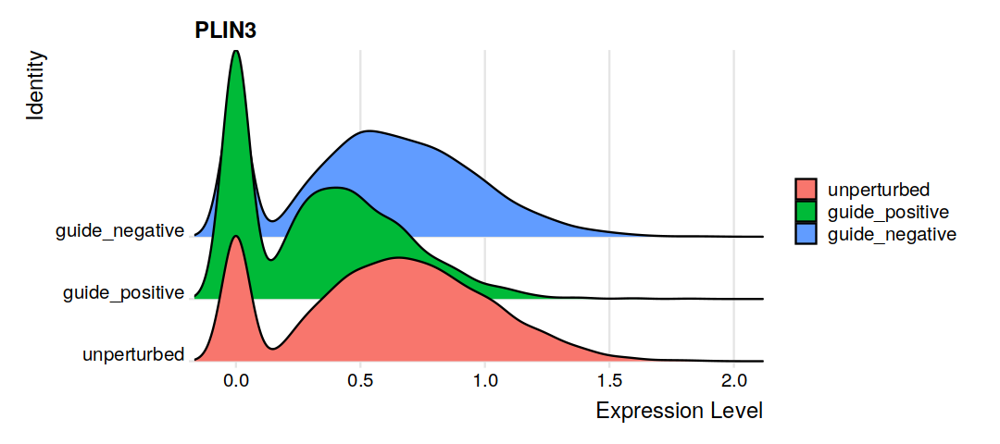


 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [======>--------------------

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ZIM3,0.0e+00,0.97,0.89,0.435,0.0e+00
LINC01705,5.7e-244,0.71,0.91,0.568,2.1e-239
SQSTM1,6.7e-215,0.74,0.99,0.980,2.5e-210
PLIN3,2.3e-202,-0.43,0.65,0.822,8.3e-198
GAS5,3.6e-167,0.58,0.99,0.980,1.3e-162
LINC01655,5.5e-167,0.42,0.72,0.385,2.0e-162
LINC02257,1.7e-165,0.41,0.73,0.397,6.1e-161
AL138828.1,4.8e-163,0.80,0.51,0.226,1.8e-158
OLAH,8.3e-156,0.30,0.27,0.054,3.0e-151


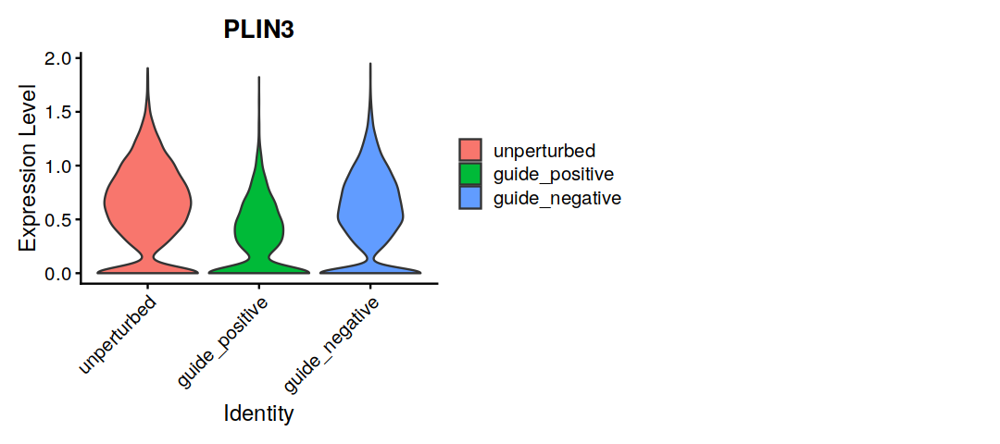

In [ ]:
guides = c('PLIN3-1a', 'PLIN3-1b', 'PLIN3-2a', 'PLIN3-2b')
#seurat_rna <- mark_guide_pos_neg(seurat_rna, guides)
seurat_rna <- mark_pert_unpert(seurat_rna, perturbed_cells_by_guide, df_guide, guides, print_counts = T)


options(repr.plot.width=9, repr.plot.height=4)
RidgePlot(
    seurat_rna,    
    features = c('PLIN3'),
    sort = FALSE,
    ncol = 1
)

VlnPlot(
    object = seurat_rna,
    features =  c('PLIN3'), 
    idents = NULL, 
    pt.size = 0, 
    sort = F, 
    ncol = 2,    
) 


markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'guide_positive',
    ident.2 = 'unperturbed',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

In [ ]:
nrow(markers)

[1] 188

Guide+ = 2073 ; Guide- = 25236 


Picking joint bandwidth of 0.053



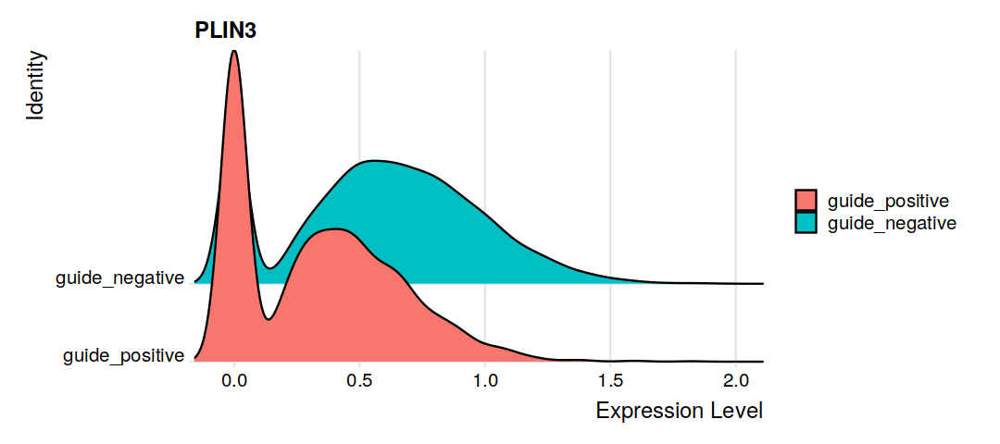


 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [=============>------------------------------]  31% with 0 failures

 Completed [==============>-----------------------------]  34% with 0 failures

 Completed [================>---------------------------]  38% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [======================>----

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PLIN3,1.4e-184,-0.37,0.65,0.81,5.1e-180
ZIM3,1.0e-83,0.34,0.89,0.71,3.8e-79
SQSTM1,5.4e-72,0.39,0.99,0.99,2.0e-67
FABP5,2.0e-68,-0.31,0.57,0.73,7.2e-64
PSAP,5.7e-55,0.29,0.99,0.98,2.1e-50
AL138828.1,6.6e-46,0.41,0.51,0.36,2.4e-41
PTMA,1.1e-45,-0.25,0.99,0.99,4.1e-41
AL357507.1,2.1e-40,0.38,0.27,0.15,7.8e-36
HMOX1,2.7e-33,0.42,0.73,0.64,1.0e-28


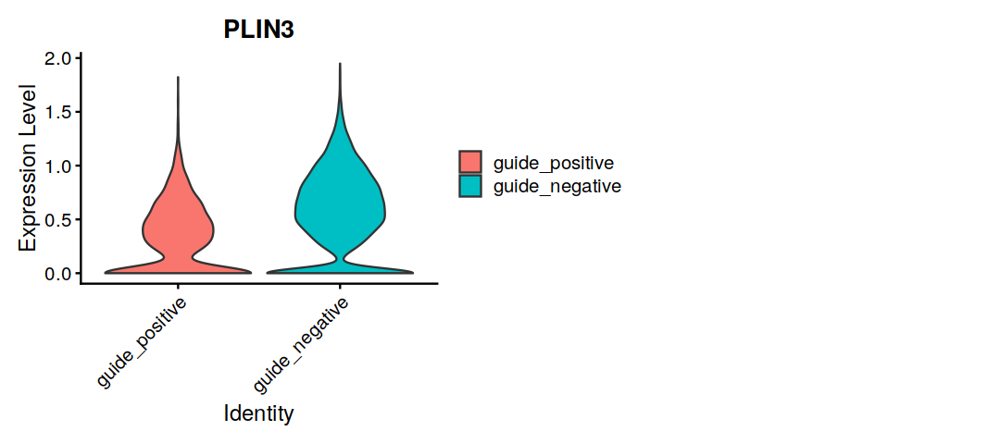

In [ ]:
guides = c('PLIN3-1a', 'PLIN3-1b', 'PLIN3-2a', 'PLIN3-2b')
#seurat_rna <- mark_guide_pos_neg(seurat_rna, guides)
seurat_rna <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides, print_counts = T)


options(repr.plot.width=9, repr.plot.height=4)
RidgePlot(
    seurat_rna,    
    features = c('PLIN3'),
    sort = FALSE,
    ncol = 1
)

VlnPlot(
    object = seurat_rna,
    features =  c('PLIN3'), 
    idents = NULL, 
    pt.size = 0, 
    sort = F, 
    ncol = 2,    
) 

markers <- FindMarkers(
    object = seurat_rna,
    slot = "data",
    ident.1 = 'guide_positive',
    ident.2 = 'guide_negative',
    test.use = "MAST",
    latent.vars = c('library', 'donor'),
    verbose = F
)

markers

### How many no-guide cells?

In [ ]:
all_cells_w_a_guide = unique(unlist(perturbed_cells_by_guide))
all_cells = unique(Cells(seurat_rna))
no_guide_cells = setdiff(all_cells, all_cells_w_a_guide)

In [ ]:
length(no_guide_cells)

[1] 6441

### How many 'non-targeting only' cells?

# * * * DE for all Targeting Guides * * *

In [ ]:
count_idents <- function(seurat_obj, idents) {
    length(Cells(subset(seurat_obj, idents = idents)))
}

In [ ]:
targets = unique(filter(df_guide, class=='targeting')$alias)
#targets = unique(df_guide$alias)
df_de = NULL
genes_to_skip = c("DE5", "CD55", "CSTB")
genes_to_skip = c()
lfc_threshold = 0.15

for(target in targets){
    if(target %in% genes_to_skip){
        cat(red("Skipping", target, "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = "MAST",
        latent.vars = c("library", "donor"),
        logfc.threshold = lfc_threshold,
        verbose = FALSE
    )
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(Red("No DE genes", target,  "\n"))
    }
    markers$de_gene = rownames(markers)
    markers$target = target
    rownames(markers) <- NULL
    df_de = rbind(df_de, markers)
}

ANPEP : CD13-1a,CD13-1b 
Guide+ = 1168 ; Guide- = 26141 



 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>----------------------

CD55 : CD55-1a,CD55-1b 
Guide+ = 1084 ; Guide- = 26225 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>---------------------

NT5E : CD73-1a,CD73-1b 
Guide+ = 1026 ; Guide- = 26283 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

FUBP1 : FUBP1-1a,FUBP1-1b 
Guide+ = 928 ; Guide- = 26381 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>---------------------

C15orf40 : C15orf40-1a,C15orf40-1b 
Guide+ = 1085 ; Guide- = 26224 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>----------------------

MAFF : MAFF-1a,MAFF-1b 
Guide+ = 875 ; Guide- = 26434 



 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>----------------------

FTH1 : FTH1-1a,FTH1-2a,FTH1-1b,FTH1-2b 
Guide+ = 3525 ; Guide- = 23784 



 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>---------------------

PLIN3 : PLIN3-1a,PLIN3-2a,PLIN3-1b,PLIN3-2b 
Guide+ = 2073 ; Guide- = 25236 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>---------------------

TKT : TKT-1a,TKT-2a,TKT-1b,TKT-2b 
Guide+ = 1988 ; Guide- = 25321 



 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

LGALS3 : LGALS3-1a,LGALS3-2a,LGALS3-1b,LGALS3-2b 
Guide+ = 2127 ; Guide- = 25182 



 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

CSTB : CSTB-1a,CSTB-2a,CSTB-1b,CSTB-2b 
Guide+ = 2350 ; Guide- = 24959 



 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [======>--------------------

CTSB : CTSB-1a,CTSB-2a,CTSB-1b,CTSB-2b 
Guide+ = 2232 ; Guide- = 25077 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>----------------------

KLF6 : KLF6-1a,KLF6-2a,KLF6-1b,KLF6-2b 
Guide+ = 2206 ; Guide- = 25103 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

DE1 : DE1-1a,DE1-2a,DE1-1b,DE1-2b 
Guide+ = 2251 ; Guide- = 25058 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  12% with 0 failures

 Completed [=====>---------------------

DE2 : DE2-1a,DE2-2a,DE2-1b,DE2-2b 
Guide+ = 1240 ; Guide- = 26069 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

DE3 : DE3-1a,DE3-2a,DE3-1b,DE3-2b 
Guide+ = 2413 ; Guide- = 24896 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>---------------------

DE4 : DE4-1a,DE4-2a,DE4-1b,DE4-2b 
Guide+ = 2554 ; Guide- = 24755 



 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>----------------------

DE5 : DE5-1a,DE5-2a,DE5-1b,DE5-2b 
Guide+ = 2492 ; Guide- = 24817 



 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

DE6 : DE6-1a,DE6-2a,DE6-1b,DE6-2b 
Guide+ = 2859 ; Guide- = 24450 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>---------------------

DE7 : DE7-1a,DE7-2a,DE7-1b,DE7-2b 
Guide+ = 2289 ; Guide- = 25020 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>----------------------

DE8 : DE8-1a,DE8-2a,DE8-1b,DE8-2b 
Guide+ = 2640 ; Guide- = 24669 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>---------------------

DE9 : DE9-1a,DE9-2a,DE9-1b,DE9-2b 
Guide+ = 1301 ; Guide- = 26008 



 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

DE10 : DE10-1a,DE10-2a,DE10-1b,DE10-2b 
Guide+ = 1946 ; Guide- = 25363 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>---------------------

DE11 : DE11-1a,DE11-2a,DE11-1b,DE11-2b 
Guide+ = 2232 ; Guide- = 25077 



 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [======>--------------------

DE12 : DE12-1a,DE12-2a,DE12-1b,DE12-2b 
Guide+ = 2118 ; Guide- = 25191 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

DE13 : DE13-1a,DE13-2a,DE13-1b,DE13-2b 
Guide+ = 1650 ; Guide- = 25659 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

DE14 : DE14-1a,DE14-2a,DE14-1b,DE14-2b 
Guide+ = 2247 ; Guide- = 25062 



 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>---------------------

DE15 : DE15-1a,DE15-2a,DE15-1b,DE15-2b 
Guide+ = 2331 ; Guide- = 24978 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>----------------------

DE16 : DE16-1a,DE16-2a,DE16-1b,DE16-2b 
Guide+ = 1875 ; Guide- = 25434 



 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>---------------------

DE17 : DE17-1a,DE17-2a,DE17-1b,DE17-2b 
Guide+ = 2054 ; Guide- = 25255 



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>----------------------

Write to file

In [ ]:
lfc = gsub("\\.", "_", lfc_threshold)
de_f_name = paste0(secondary_a_path, "/integrated/DE_outputs/DE_genes_by_target_LFC_", lfc, "_UNFILTERED.tsv")
write.table(df_de, de_f_name, sep="\t", quote = F, row.names = F)

### Filter out spurious hits

In [ ]:
# Some genes come up as differentially expressed all the time
# Filter those out, and write to another file
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
df_de = filter(df_de, !(de_gene  %in% funky_de_genes))

de_f_name = paste0(secondary_a_path, "/integrated/DE_outputs/DE_genes_by_target_LFC_", lfc, "_FILTERED.tsv")
write.table(df_de, de_f_name, sep="\t", quote = F, row.names = F)

# Inpect DE results

In [ ]:
df_de = read.table(de_f_name, sep="\t",  header = T)

Print top high-confidence hits

In [ ]:
df_de %>% filter(avg_log2FC < 0) %>% arrange(p_val_adj) %>% head(30)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,0.0e+00,-0.55,1.000,1.00,0.0e+00,FTH1,FTH1
2,5.1e-274,-0.94,0.796,0.91,1.9e-269,LGALS3,LGALS3
3,5.6e-263,-0.72,0.334,0.80,2.0e-258,NT5E,NT5E
4,1.3e-219,-0.54,0.939,0.98,4.6e-215,TKT,TKT
5,8.5e-193,-0.36,0.171,0.59,3.1e-188,C15orf40,C15orf40
6,1.3e-184,-0.37,0.647,0.81,4.6e-180,PLIN3,PLIN3
7,9.0e-160,-0.69,0.942,0.95,3.3e-155,CTSB,CTSB
8,7.5e-156,-0.63,0.458,0.78,2.8e-151,ANPEP,ANPEP
9,7.3e-128,-0.31,0.951,0.97,2.7e-123,CSTB,CSTB


In [ ]:
targets = unique(df_de$target)

for(t in targets){
    print(filter(df_de, target == t) %>% head(1))
    #cat(yellow("------------------------------------------------------------\n\n\n"))

}

     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 7.5e-156      -0.63  0.46  0.78  2.8e-151   ANPEP  ANPEP
    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 2.1e-99      -0.21 0.088  0.36   7.7e-95    CD55   CD55
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 5.6e-263      -0.72  0.33   0.8    2e-258    NT5E   NT5E
    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 2.6e-52      -0.25  0.47  0.67   9.4e-48   FUBP1  FUBP1
     p_val avg_log2FC pct.1 pct.2 p_val_adj  de_gene   target
1 8.5e-193      -0.36  0.17  0.59  3.1e-188 C15orf40 C15orf40
    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 1.2e-51       0.45  0.91  0.72   4.4e-47    ZIM3   MAFF
  p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1     0      -0.55     1     1         0    FTH1   FTH1
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 1.3e-184      -0.37  0.65  0.81  4.6e-180   PLIN3  PLIN3
     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 1

# Inspect DE between clusters

## Are HMOX1, SQSTM1 etc localized to a cluster? No

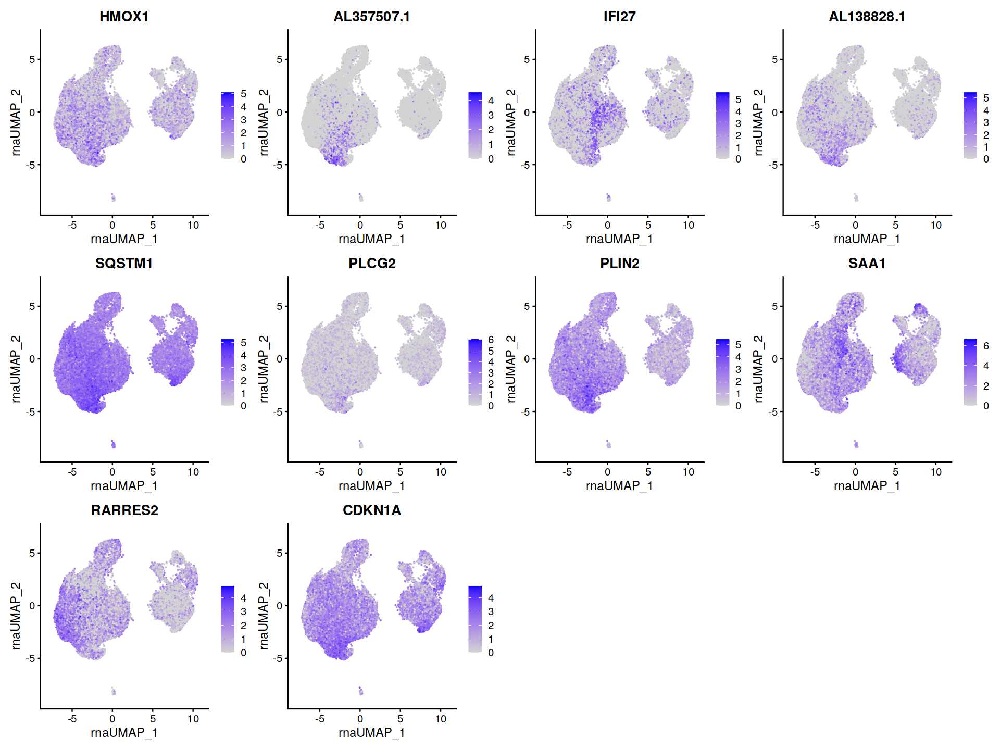

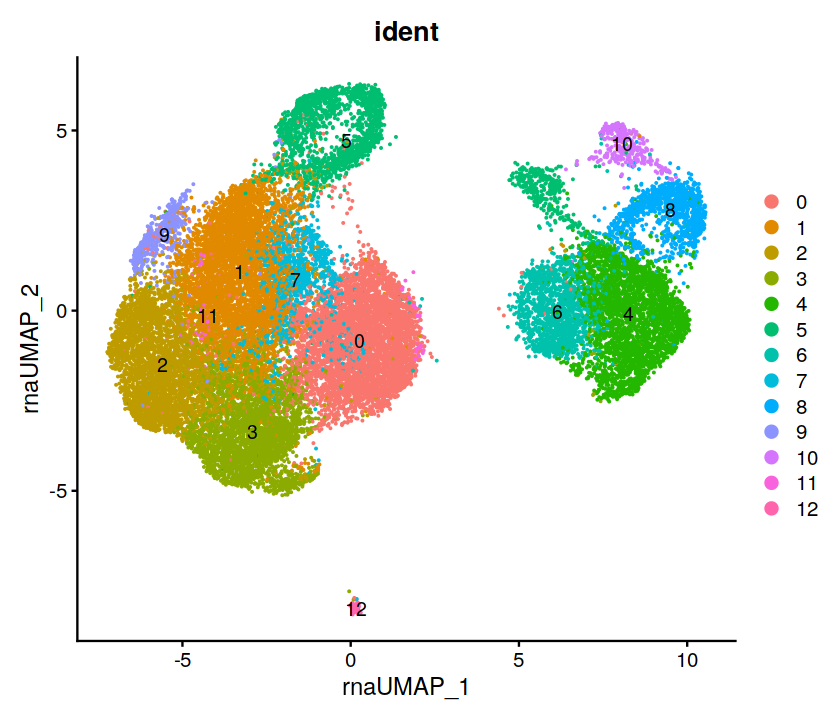

In [ ]:
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
options(repr.plot.width = 16, repr.plot.height = 12)
FeaturePlot(seurat_combined, features = funky_de_genes, ncol=4)
options(repr.plot.width=7, repr.plot.height=6)    
DimPlot(seurat_combined, label=T, group.by='ident')

# Compare Cluster 1 to 4

In [ ]:
seurat_dummy = NormalizeData(seurat_combined)

In [ ]:
Idents(seurat_dummy) <- seurat_dummy$seurat_clusters

markers <- FindMarkers(
        object = seurat_combined,
        assay = 'RNA',
        slot = "data",
        ident.1 = 1,
        ident.2 = 4,
        test.use = "MAST",
        logfc.threshold = 2,
        latent.vars = c('library', 'donor'),
        verbose = F
    )


 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>-----------------------

# Plot upregulated

In [ ]:
cluster_de_genes <- rownames(filter(markers, (p_val_adj < 1e-80) & (avg_log2FC > 2))) %>% head(50)
cat(cluster_de_genes, "\n")

AC003092.1 AC113386.1 AFF3 AL589669.1 AP1M2 AP1S1 AQP1 ASS1 AURKAIP1 BNC2 C19orf33 C3 C4orf19 CA12 CARHSP1 CASC19 CD70 CDH2 CDH6 CHRD CTSB DLGAP1 DNAJC12 EIF4A1 ENPEP FN1 FRMD5 GDA GLIS1 GPX3 GSR GSTO1 GTF3C6 HAVCR1 HDAC9 HOOK1 IGFBP4 IL18 IL32 KCNJ15 L3MBTL4 LINC01322 LINC01611 LINC01697 LRMDA MFGE8 MFSD2A MGST1 MICAL2 MLPH 


In [ ]:
markers %>% arrange(p_val_adj) %>% filter(avg_log2FC > 5) %>% head(50) %>% rownames()

[1] "AC003092.1" "AC113386.1" "AFF3"       "AL589669.1" "AP1M2"     
 [6] "AP1S1"      "AQP1"       "ASS1"       "AURKAIP1"   "BNC2"      
[11] "C19orf33"   "C3"         "C4orf19"    "CA12"       "CARHSP1"   
[16] "CASC19"     "CD70"       "CDH2"       "CDH6"       "CHRD"      
[21] "CTSB"       "DLGAP1"     "EIF4A1"     "ENPEP"      "FN1"       
[26] "FRMD5"      "GDA"        "GLIS1"      "GPX3"       "GSR"       
[31] "GSTO1"      "GTF3C6"     "HDAC9"      "HOOK1"      "IGFBP4"    
[36] "IL18"       "IL32"       "KCNJ15"     "L3MBTL4"    "LINC01322" 
[41] "LINC01611"  "LINC01697"  "LRMDA"      "MFGE8"      "MFSD2A"    
[46] "MGST1"      "MICAL2"     "MLPH"       "MYO5B"      "NALCN-AS1"

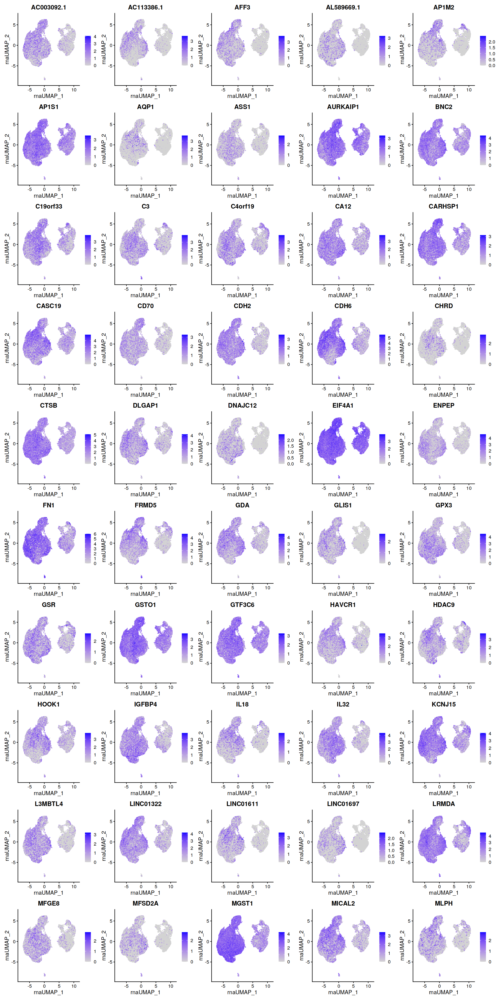

In [ ]:
options(repr.plot.width=18, repr.plot.height=36)
FeaturePlot(seurat_combined, features = cluster_de_genes, ncol=5)

In [ ]:
sample_n(markers, 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GAREM1,7.0e-83,33.9,0.735,0.53,2.6e-78
PRAG1,1.2e-09,-22.6,0.349,0.40,4.5e-05
RFC1,5.6e-53,31.3,0.862,0.78,2.0e-48
ARPC1B,1.4e-231,-5.3,0.995,0.96,5.2e-227
MAP2K1,1.6e-16,-2.2,0.690,0.59,6.0e-12
C12orf4,1.1e-02,-10.3,0.307,0.27,1.0e+00
GPBP1,1.7e-28,5.0,0.803,0.72,6.2e-24
AGAP3,2.8e-16,9.8,0.335,0.24,1.0e-11
ERMP1,2.0e-158,-14.7,0.257,0.53,7.5e-154


# Plot downregulated

BST2 CLDN10 CRNDE CSGALNACT1 DENND2A ERBB4 GPNMB HOXB-AS3 HOXB3 HOXD10 IRX2 IRX3 KCNIP4 LINC01116 LINC01503 MAL MECOM PANTR1 PDE1A PDLIM4 PTH1R SCIN SFRP1 SGIP1 SIM1 SIM2 SKAP1 SNED1 TFAP2B TFCP2L1 WFDC2 IRX1 IFITM2 PHACTR1 TPM2 PRKCQ DEFB1 HOXB9 SLC16A5 IGFBP2 ARHGEF38 REPS2 POU3F3 PPFIA2 SCHLAP1 KCNJ1 L1CAM EML1 ARPC1B AC096531.2 


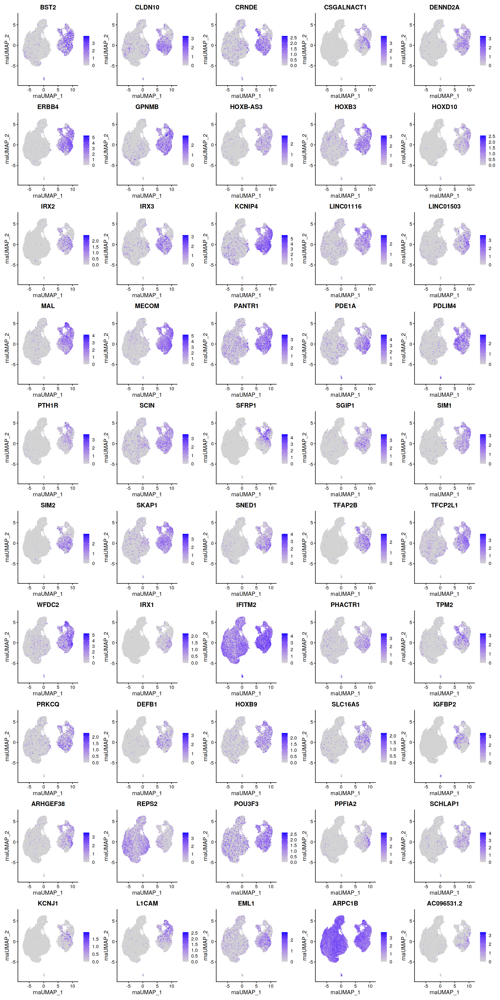

In [ ]:
cluster_de_genes <- rownames(filter(markers, (p_val_adj < 1e-40) & (avg_log2FC < -4))) %>% head(50)
cat(cluster_de_genes, "\n")
options(repr.plot.width=18, repr.plot.height=36)
FeaturePlot(seurat_combined, features = cluster_de_genes, ncol=5)

## Plot all controls

In [ ]:
all_controls = unique(filter(df_guide, subclass == "tss" | subclass == 'de_control')$alias)

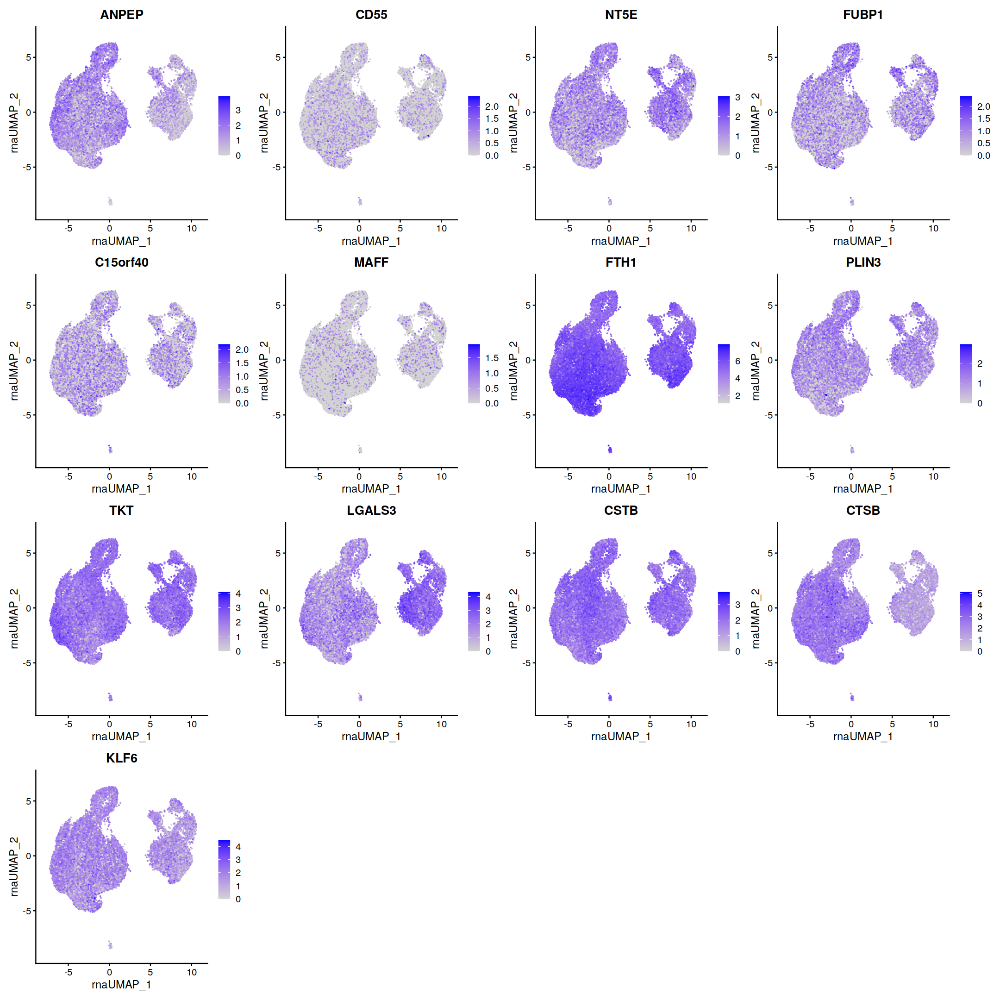

In [ ]:
options(repr.plot.width=18, repr.plot.height=18)
FeaturePlot(seurat_combined, features = all_controls, ncol=4)

# Visualize Knockdowns

## Spurious hits

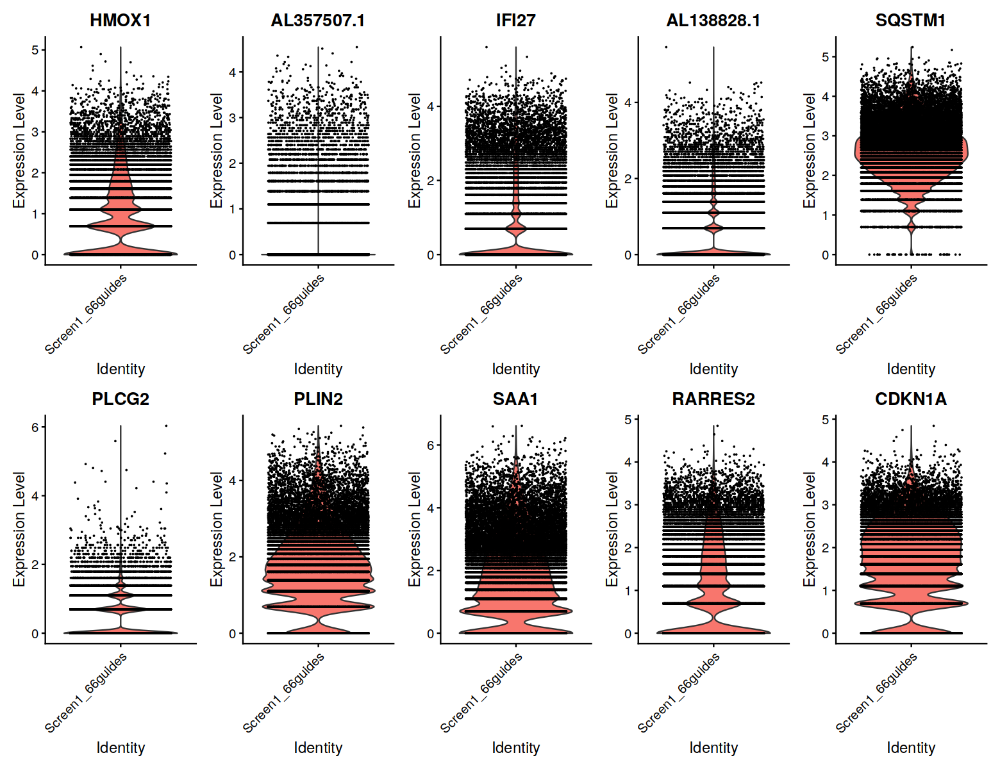

In [ ]:
funky_de_genes = c("HMOX1", "AL357507.1", "IFI27", "AL138828.1", "SQSTM1", "PLCG2", "PLIN2", "SAA1", "RARRES2", "CDKN1A")
options(repr.plot.width = 13, repr.plot.height = 10)
VlnPlot(seurat_combined, features = funky_de_genes, group.by = 'orig.ident', pt.size = 0.001, ncol=5)

## TSS controls

[1] "ANPEP"
Guide+ = 1168 ; Guide- = 26141 
[1] "CD55"
Guide+ = 1084 ; Guide- = 26225 
[1] "NT5E"
Guide+ = 1026 ; Guide- = 26283 
[1] "FUBP1"
Guide+ = 928 ; Guide- = 26381 
[1] "C15orf40"
Guide+ = 1085 ; Guide- = 26224 
[1] "MAFF"
Guide+ = 875 ; Guide- = 26434 


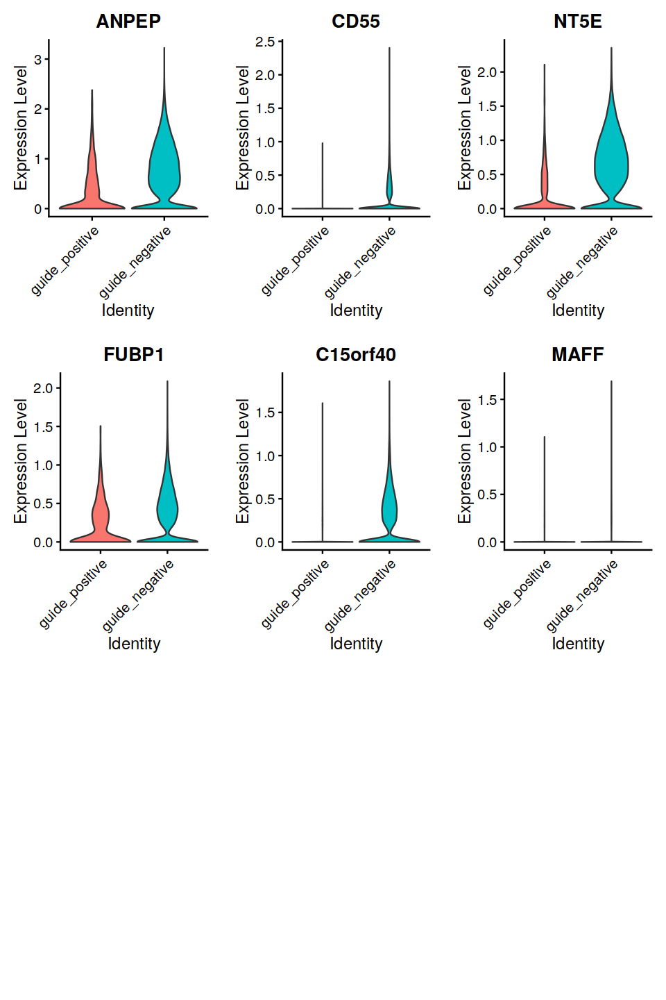

In [ ]:
targets = unique(filter(df_guide, subclass=='tss')$alias)
plots = vlnplot_for_targets(seurat_rna, df_guide, perturbed_cells_by_guide, targets)
options(repr.plot.width=8, repr.plot.height=12)
ggarrange(plotlist=plots, ncol=3, nrow = 3)

## DE controls

[1] "FTH1"
Guide+ = 3525 ; Guide- = 23784 
[1] "PLIN3"
Guide+ = 2073 ; Guide- = 25236 
[1] "TKT"
Guide+ = 1988 ; Guide- = 25321 
[1] "LGALS3"
Guide+ = 2127 ; Guide- = 25182 
[1] "CSTB"
Guide+ = 2350 ; Guide- = 24959 
[1] "CTSB"
Guide+ = 2232 ; Guide- = 25077 
[1] "KLF6"
Guide+ = 2206 ; Guide- = 25103 


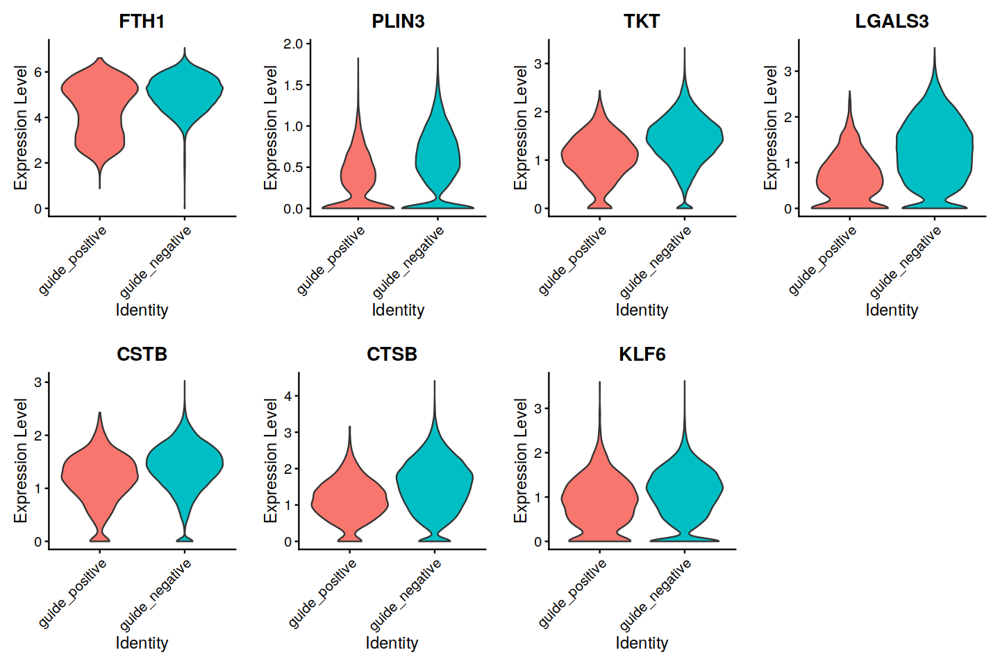

In [ ]:
targets = unique(filter(df_guide, subclass=='de_control')$alias)
plots = vlnplot_for_targets(seurat_rna, df_guide, perturbed_cells_by_guide, targets)
options(repr.plot.width=12, repr.plot.height=8)
ggarrange(plotlist=plots, ncol=4, nrow = 2)

## CKD DE 

[1] "DE6"
Guide+ = 2859 ; Guide- = 24450 


Picking joint bandwidth of 0.0584

Picking joint bandwidth of 0.0759

Picking joint bandwidth of 0.103



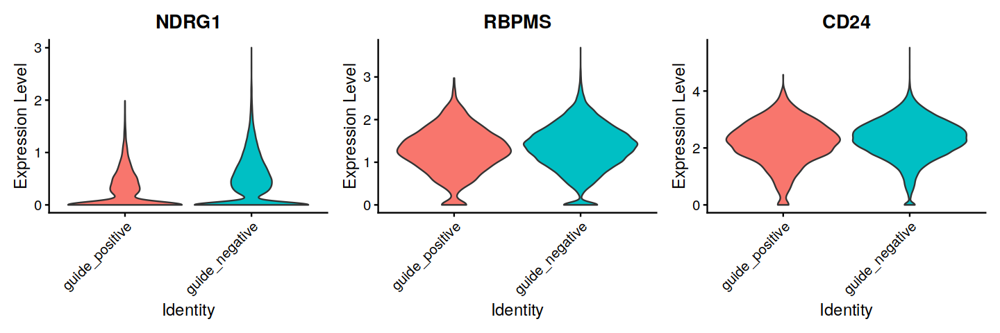

[1] "DE15"
Guide+ = 2331 ; Guide- = 24978 


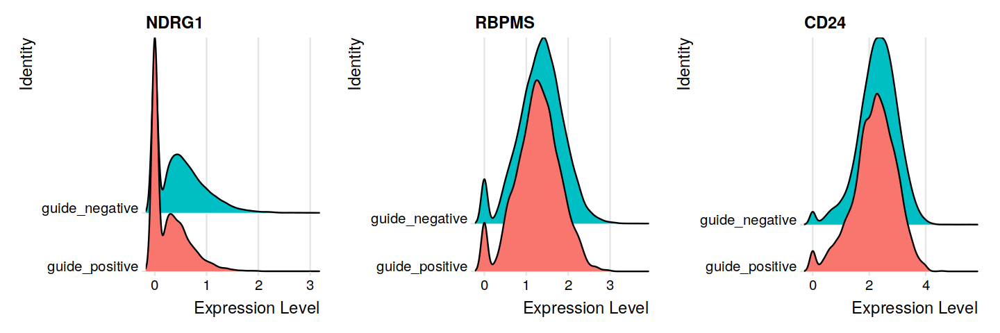

Picking joint bandwidth of 0.068

Picking joint bandwidth of 0.0779

Picking joint bandwidth of 0.106



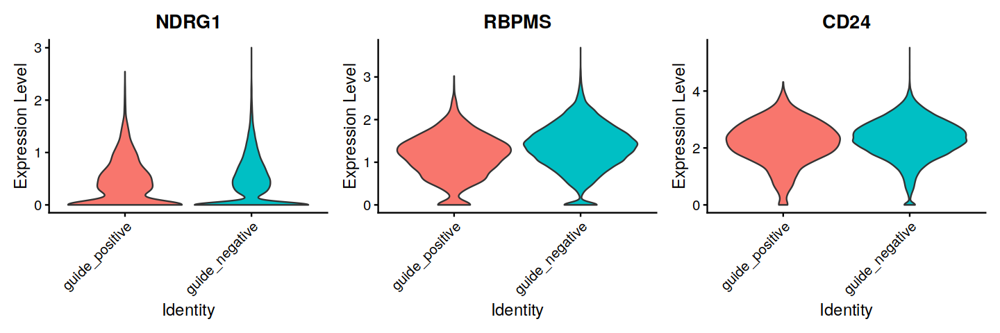

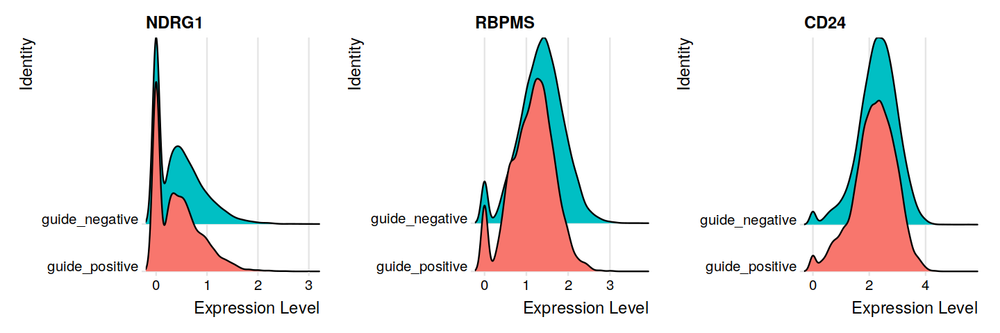

In [ ]:
targets = c("DE6", "DE15")
regulated_genes = c("NDRG1", "RBPMS", "CD24")

for(i in seq_along(targets)) {
    target = targets[i]
    print(target)
    guides = get_guides_by_subclass(df_guide, 'alias', target)
    seurat_rna <- mark_guide_pos_neg(
        seurat_rna, 
        perturbed_cells_by_guide, 
        guides, 
        print_counts = T
    )

    options(repr.plot.width=6, repr.plot.height=4)
    plt <- VlnPlot(
        object = seurat_rna,
        features = regulated_genes, 
        idents = NULL, 
        pt.size = 0, 
        sort = F, 
        ncol = 3,    
    ) 

    options(repr.plot.width=12, repr.plot.height=4)
    plt2 <- RidgePlot(
        object = seurat_rna,
        features = regulated_genes, 
        idents = NULL,  
        sort = F, 
        ncol = 3,    
    ) 

    print(plt) 
    print(plt2)
}



# Check DE for genes near SNPs

In [ ]:
select_distal  = df_guide$subclass == 'ckd_de'
df_snps = unique(df_guide[select_distal, c('gene','alias')])

In [ ]:
snp_coords = ncbi_snp_query(df_snps$gene)

Getting info about the following rsIDs: rs2823139, rs7642977, rs78581838, rs7707989, rs527616, rs10283362, rs34861762, rs16874072, rs881858, rs4669722, rs76839935, rs6839100, rs11154336, rs4720089, rs2979488, rs2661503, rs10224210



In [ ]:
snp_upstream_range   = 1000000
snp_downstream_range = 1000000

df_snp_coords                 = data.frame(chr=paste0("chr", snp_coords$chromosome))
df_snp_coords$start_position  = snp_coords$bp #+ snp_upstream_range
df_snp_coords$end_position    = snp_coords$bp #+ snp_downstream_range
df_snp_coords$strand          = '*'
df_snp_coords$hgnc_symbol     = snp_coords$rsid
df_snp_coords$chromosome_name = snp_coords$chromosome
#snp_granges = makeGRangesFromDataFrame(df_dummy)

In [ ]:
ensembl <- useEnsembl(biomart = "genes", dataset = "hsapiens_gene_ensembl")
searchDatasets(mart = ensembl, pattern = "hsapiens")
mart <- useMart("ensembl")
mart <- useDataset("hsapiens_gene_ensembl", mart)

,dataset,description,version
,<I<chr>>,<I<chr>>,<I<chr>>
79,hsapiens_gene_ensembl,Human genes (GRCh38.p13),GRCh38.p13


# Find neighbors of targets

In [ ]:
genes_in_assay = rownames(seurat_rna[['RNA']]@counts)
m <- useMart('ensembl', dataset='hsapiens_gene_ensembl') # create a mart object

In [ ]:
source('/home/vsevim/prj/workflows/ckd/secondary/helper_functions_for_diffex.r')
control_targets = unique(filter(df_guide, subclass=='tss' | subclass == 'de_control')[,c('alias')])

df_target_coords <- getBM(mart=m, attributes=c('hgnc_symbol', 'description', 'chromosome_name',
                                 'start_position', 'end_position', 'strand',
                                 'ensembl_gene_id'),
                        filters = 'hgnc_symbol', values = control_targets)
                        
df_target_coords <- filter(df_target_coords, chromosome_name %in% c(1:23, "X","Y"))

In [ ]:
gene_neighbors_list = get_neighboring_genes(bm, df_target_coords, genes_in_assay)
snp_neighbors_list  = get_neighboring_genes(bm, df_snp_coords, genes_in_assay)
neighbors_list =  append(gene_neighbors_list, snp_neighbors_list) 

ANPEP 15 88784895 90815401 
C15orf40 15 81988441 84011641 
CD55 1 206321519 208386804 
CSTB 21 42772511 44776330 
CTSB 8 10842524 12869533 
FTH1 11 60959718 62967634 
FUBP1 1 76944055 78979110 
KLF6 10 2775996 4785281 
LGALS3 14 54124110 56145423 
MAFF 22 37200767 39216507 
NT5E 6 84449584 86495791 
PLIN3 19 3838341 5867694 
TKT 3 52224712 54256052 
rs2823139 21 14204463 16204463 
rs7642977 3 193092961 195092961 
rs78581838 21 13864259 15864259 
rs7707989 5 67396052 69396052 
rs527616 18 25757460 27757460 
rs10283362 8 132320717 134320717 
rs34861762 8 22890907 24890907 
rs16874072 4 22741827 24741827 
rs881858 6 42838872 44838872 
rs4669722 2 10390110 12390110 
rs76839935 7 150870466 152870466 
rs6839100 4 75458036 77458036 
rs11154336 6 124899862 126899862 
rs4720089 7 31964026 33964026 
rs2979488 8 29423114 31423114 
rs2661503 6 50644819 52644819 
rs10224210 7 150716108 152716108 


In [ ]:
list.save(neighbors_list, "/home/vsevim/prj/1012-ckd/S1/scripts/library_csv/neighbors_list.rds")

## Run diffex on genes neighboring the snps w/ min_LFC = 0.10

In [ ]:
df_targets = unique(filter(df_guide, subclass=='ckd_de')[,c('alias','gene','subclass', 'label')])
df_targets = unique(filter(df_guide, class=='targeting')[,c('alias','gene','subclass', 'label')])
df_neighbor_de = NULL
test_use = "LR" #"MAST"  #"wilcox" "LR"
guides_to_skip = c()  #c("DE6", "DE15")  

for(i in 1:nrow(df_targets)) {
    target          = df_targets[i,'alias']
    target_subclass = df_targets[i, 'subclass']
    label           = df_targets[i, 'label']
    snp_id_or_gene_name = df_targets[i,'gene']
    
    if(!str_detect(target, regex("^DE\\d+$"))) {
        ckd_de = 
        neigbors = neighbors_list[[target]]
    } else {
        neigbors = neighbors_list[[snp_id_or_gene_name]]
    }

    if((target %in% guides_to_skip) | length(neigbors) == 0 ){
        cat(red("Skipping", target, snp_id_or_gene_name, length(neigbors), "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target, target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        features = neigbors,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = test_use,
        logfc.threshold = 0.01,
        latent.vars = c("library", "donor"),
        only.pos = FALSE, 
        verbose = FALSE
    )
    # 
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(red("No DE genes", test_use,":", target, "\n"))
        next
    } 
    markers$de_gene = rownames(markers)
    markers$target = target
    markers$subclass = target_subclass
    markers$label = label
    rownames(markers) <- NULL
    df_neighbor_de = rbind(df_neighbor_de, markers)
    print(markers)
}

ANPEP ANPEP : CD13-1a,CD13-1b 
Guide+ = 1168 ; Guide- = 26141 
      p_val avg_log2FC pct.1 pct.2 p_val_adj   de_gene target subclass
1  4.2e-155     -0.633  0.46 0.781  1.5e-150     ANPEP  ANPEP      tss
2   1.0e-14     -0.144  0.77 0.823   3.7e-10      IDH2  ANPEP      tss
3   2.6e-10      0.089  0.67 0.582   9.5e-06     AP3S2  ANPEP      tss
4   2.3e-06      0.080  0.82 0.796   8.4e-02      NGRN  ANPEP      tss
5   2.8e-06      0.081  0.58 0.513   1.0e-01     MFGE8  ANPEP      tss
6   8.8e-05     -0.095  0.80 0.804   1.0e+00    SEMA4B  ANPEP      tss
7   3.9e-03     -0.064  0.95 0.960   1.0e+00      CIB1  ANPEP      tss
8   4.3e-03     -0.032  0.16 0.172   1.0e+00     FANCI  ANPEP      tss
9   2.7e-02      0.020  0.28 0.236   1.0e+00     ARPIN  ANPEP      tss
10  5.8e-02      0.015  0.27 0.232   1.0e+00     MESP1  ANPEP      tss
11  9.2e-02      0.014  0.10 0.087   1.0e+00 CRTC3-AS1  ANPEP      tss
12  1.4e-01      0.015  0.28 0.239   1.0e+00    ZNF710  ANPEP      tss
13  1.5e-01   

In [ ]:
#rownames(df_neighbor_de) <- df_neighbor_de$de_gene
head(df_neighbor_de[df_neighbor_de$target == "CSTB",], 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target,subclass,label
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
140,9.5e-113,-0.306,0.95,0.97,3.5e-108,CSTB,CSTB,de_control,Control DE
141,1.3e-11,-0.096,0.83,0.85,4.6e-07,PDXK,CSTB,de_control,Control DE
142,2.7e-03,0.029,0.68,0.64,1.0e+00,UBE2G2,CSTB,de_control,Control DE
143,3.1e-02,0.027,0.85,0.83,1.0e+00,NDUFV3,CSTB,de_control,Control DE
144,6.2e-02,-0.023,0.53,0.53,1.0e+00,PFKL,CSTB,de_control,Control DE
145,1.6e-01,0.013,0.64,0.61,1.0e+00,RRP1B,CSTB,de_control,Control DE


### Correct p-values by total number of comparisons

In [ ]:
n_tests = length(flatten(neighbors_list))
print(n_tests)
df_neighbor_de$p_val_adj_mine =  p.adjust(
    p = df_neighbor_de$p_val,
    method = "bonferroni",
    n = n_tests
)


[1] 727


In [ ]:
head(df_neighbor_de[df_neighbor_de$target == "CSTB",], 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target,subclass,label,p_val_adj_mine
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
140,9.5e-113,-0.306,0.95,0.97,3.5e-108,CSTB,CSTB,de_control,Control DE,6.9e-110
141,1.3e-11,-0.096,0.83,0.85,4.6e-07,PDXK,CSTB,de_control,Control DE,9.2e-09
142,2.7e-03,0.029,0.68,0.64,1.0e+00,UBE2G2,CSTB,de_control,Control DE,1.0e+00
143,3.1e-02,0.027,0.85,0.83,1.0e+00,NDUFV3,CSTB,de_control,Control DE,1.0e+00
144,6.2e-02,-0.023,0.53,0.53,1.0e+00,PFKL,CSTB,de_control,Control DE,1.0e+00
145,1.6e-01,0.013,0.64,0.61,1.0e+00,RRP1B,CSTB,de_control,Control DE,1.0e+00


## Volcano Plot

In [ ]:
colors <- ifelse(
    df_neighbor_de$subclass == 'tss', 'black',
    ifelse(df_neighbor_de$subclass == 'de_control', 'gray', 'green') 
)
names(colors) <- df_neighbor_de$label

Warning message:
"One or more p-values is 0. Converting to 10^-1 * current lowest non-zero p-value..."
Scale for x is already present.
Adding another scale for x, which will replace the existing scale.


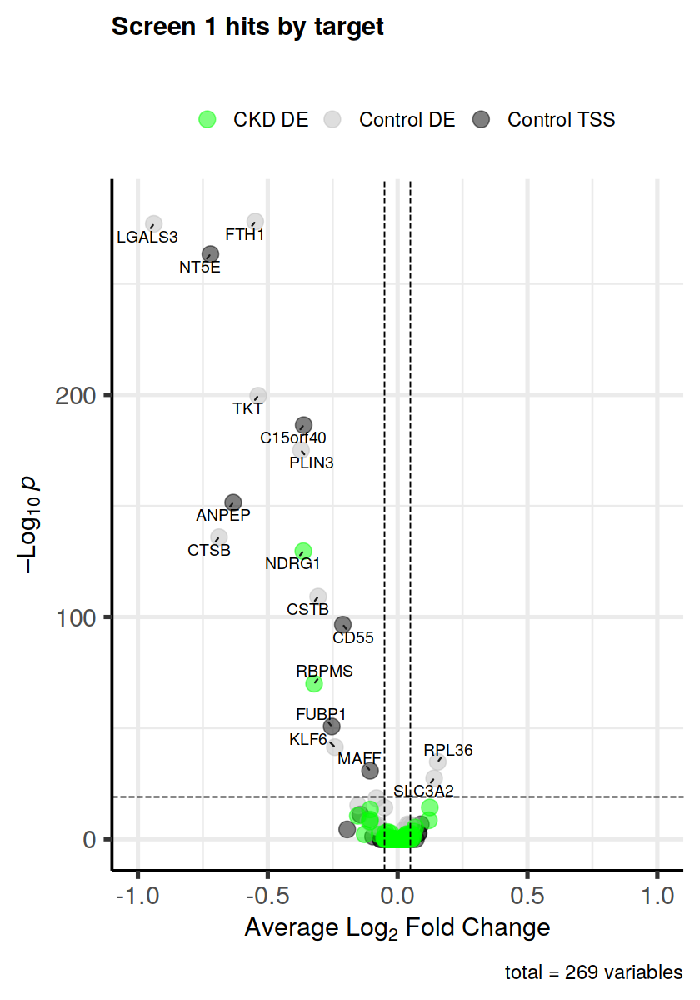

In [ ]:
options(repr.plot.width = 7, repr.plot.height = 10)
EnhancedVolcano(df_neighbor_de, 
                lab = df_neighbor_de$de_gene,
                x ="avg_log2FC",
                y ="p_val_adj_mine",
                title = 'Screen 1 hits by target',
                subtitle = '', 
                colCustom = colors,
                drawConnectors = TRUE,
                arrowheads = FALSE,
                pCutoff = 10e-20,
                FCcutoff = 0.05,
                pointSize = 5.0,
                labSize = 4.0
                ) +
                xlim(-1, 1) +
                xlab(expression(paste("Average ", Log[2], " Fold Change"))) +
                ylab(expression(paste("\u2013", Log[10], " ", italic(p))))
                

# lab = df_neighbor_de$de_gene,
# drawConnectors = TRUE,

In [ ]:
head(df_neighbor_de, 20)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target,subclass,label,p_val_adj_mine
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,4.2e-155,-0.633,0.458,0.781,1.5e-150,ANPEP,ANPEP,tss,Control TSS,3.1e-152
2,1.0e-14,-0.144,0.770,0.823,3.7e-10,IDH2,ANPEP,tss,Control TSS,7.3e-12
3,2.6e-10,0.089,0.672,0.582,9.5e-06,AP3S2,ANPEP,tss,Control TSS,1.9e-07
4,2.3e-06,0.080,0.824,0.796,8.4e-02,NGRN,ANPEP,tss,Control TSS,1.7e-03
5,2.8e-06,0.081,0.583,0.513,1.0e-01,MFGE8,ANPEP,tss,Control TSS,2.1e-03
6,8.8e-05,-0.095,0.800,0.804,1.0e+00,SEMA4B,ANPEP,tss,Control TSS,6.4e-02
7,3.9e-03,-0.064,0.955,0.960,1.0e+00,CIB1,ANPEP,tss,Control TSS,1.0e+00
8,4.3e-03,-0.032,0.164,0.172,1.0e+00,FANCI,ANPEP,tss,Control TSS,1.0e+00
9,2.7e-02,0.020,0.281,0.236,1.0e+00,ARPIN,ANPEP,tss,Control TSS,1.0e+00


# Run Diffex using LR instead of MAST

In [ ]:
targets = unique(filter(df_guide, class=='targeting')$alias)
df_de = NULL
genes_to_skip = c("DE5", "CD55", "CSTB")
genes_to_skip = c()

for(target in targets){
    if(target %in% genes_to_skip){
        cat(red("Skipping", target, "\n"))
        next
    }
    guides_4_target = get_guides_by_subclass(df_guide, 'alias', target)
    cat(blue(target,":"), paste(guides_4_target, collapse=","),"\n")
    seurat_dummy <- mark_guide_pos_neg(seurat_rna, perturbed_cells_by_guide, guides_4_target, print_counts = T)
    
    markers <- FindMarkers(
        object = seurat_dummy,
        slot = "data",
        ident.1 = 'guide_positive',
        ident.2 = 'guide_negative',
        test.use = "LR",
        latent.vars = c("library", "donor"),
        logfc.threshold = 0.25,
        verbose = FALSE
    )
    # latent.vars = c('library') 
    if(nrow(markers)==0) {
        cat(Red("No DE genes", target,  "\n"))
    }
    markers$de_gene = rownames(markers)
    markers$target = target
    rownames(markers) <- NULL
    df_de = rbind(df_de, markers)
}

ANPEP : CD13-1a,CD13-1b 
Guide+ = 1168 ; Guide- = 26141 
CD55 : CD55-1a,CD55-1b 
Guide+ = 1084 ; Guide- = 26225 
NT5E : CD73-1a,CD73-1b 
Guide+ = 1026 ; Guide- = 26283 
FUBP1 : FUBP1-1a,FUBP1-1b 
Guide+ = 928 ; Guide- = 26381 
C15orf40 : C15orf40-1a,C15orf40-1b 
Guide+ = 1085 ; Guide- = 26224 
MAFF : MAFF-1a,MAFF-1b 
Guide+ = 875 ; Guide- = 26434 
FTH1 : FTH1-1a,FTH1-2a,FTH1-1b,FTH1-2b 
Guide+ = 3525 ; Guide- = 23784 
PLIN3 : PLIN3-1a,PLIN3-2a,PLIN3-1b,PLIN3-2b 
Guide+ = 2073 ; Guide- = 25236 
TKT : TKT-1a,TKT-2a,TKT-1b,TKT-2b 
Guide+ = 1988 ; Guide- = 25321 
LGALS3 : LGALS3-1a,LGALS3-2a,LGALS3-1b,LGALS3-2b 
Guide+ = 2127 ; Guide- = 25182 
CSTB : CSTB-1a,CSTB-2a,CSTB-1b,CSTB-2b 
Guide+ = 2350 ; Guide- = 24959 
CTSB : CTSB-1a,CTSB-2a,CTSB-1b,CTSB-2b 
Guide+ = 2232 ; Guide- = 25077 
KLF6 : KLF6-1a,KLF6-2a,KLF6-1b,KLF6-2b 
Guide+ = 2206 ; Guide- = 25103 
DE1 : DE1-1a,DE1-2a,DE1-1b,DE1-2b 
Guide+ = 2251 ; Guide- = 25058 
DE2 : DE2-1a,DE2-2a,DE2-1b,DE2-2b 
Guide+ = 1240 ; Guide- = 26069 
DE

In [ ]:
df_de[df_de$target == "DE15", ]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,de_gene,target
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
752,1.2e-84,0.40,0.90,0.71,4.3e-80,ZIM3,DE15
753,1.3e-75,0.33,0.99,0.98,4.9e-71,PSAP,DE15
754,1.4e-73,-0.32,0.94,0.96,5.1e-69,RBPMS,DE15
755,2.6e-73,0.39,0.99,0.99,9.6e-69,SQSTM1,DE15
756,2.6e-49,0.32,0.94,0.88,9.6e-45,CDKN1A,DE15
757,3.4e-48,0.45,0.28,0.15,1.2e-43,AL357507.1,DE15
758,2.2e-42,-0.25,1.00,0.99,8.2e-38,PTMA,DE15
759,1.4e-40,0.29,0.93,0.88,5.2e-36,MDM2,DE15
760,1.0e-39,-0.39,0.83,0.86,3.8e-35,TUBA1B,DE15


In [ ]:
targets = unique(df_de$target)

for(t in targets){
    print(filter(df_de, target == t) %>% head(3))
    cat(yellow("------------------------------------------------------------\n\n\n"))

}

     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 4.2e-155      -0.63  0.46  0.78  1.5e-150   ANPEP  ANPEP
2  8.2e-57       0.47  1.00  0.99   3.0e-52  SQSTM1  ANPEP
3  9.2e-46       0.43  0.89  0.72   3.4e-41    ZIM3  ANPEP
------------------------------------------------------------


    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 1.0e-39       0.39  0.89  0.72   3.7e-35    ZIM3   CD55
2 9.4e-39       0.40  0.99  0.99   3.4e-34  SQSTM1   CD55
3 4.9e-30       0.55  0.73  0.65   1.8e-25   HMOX1   CD55
------------------------------------------------------------


     p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 6.2e-267      -0.72  0.33  0.80  2.3e-262    NT5E   NT5E
2  2.3e-36       0.41  0.89  0.72   8.6e-32    ZIM3   NT5E
3  1.6e-34       0.41  1.00  0.99   5.9e-30  SQSTM1   NT5E
------------------------------------------------------------


    p_val avg_log2FC pct.1 pct.2 p_val_adj de_gene target
1 2.5e-54      -0.25  0.47  0.67   9.1e-50   FUBP

# Does the control set have always higher expression regardless of the gene?

[1] "DE6"
Guide+ = 2859 ; Guide- = 24450 
[1] "DE15"
Guide+ = 2331 ; Guide- = 24978 


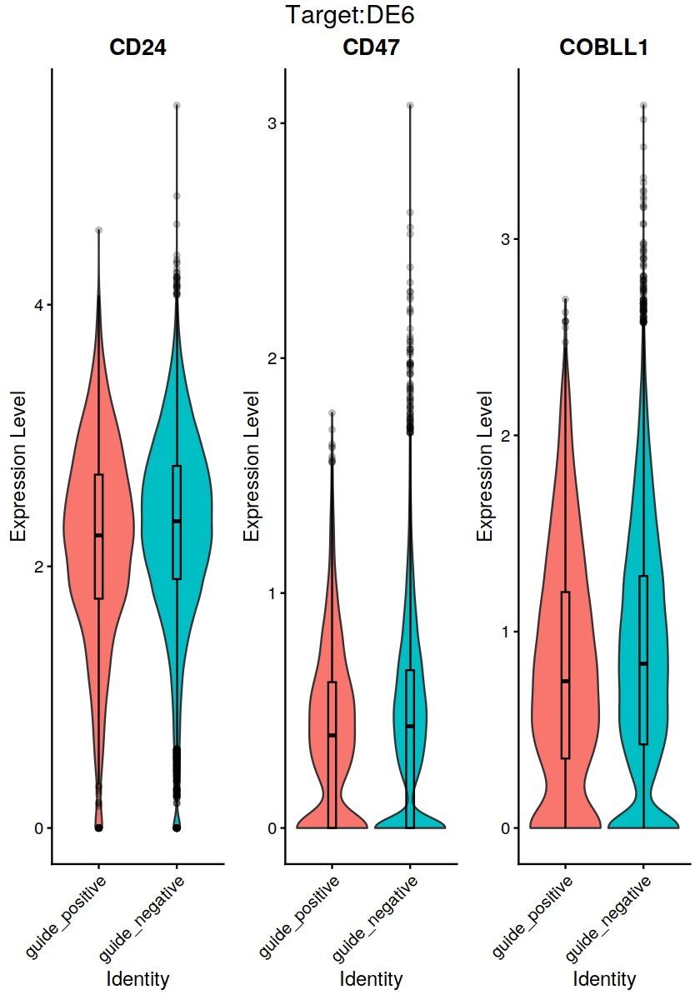

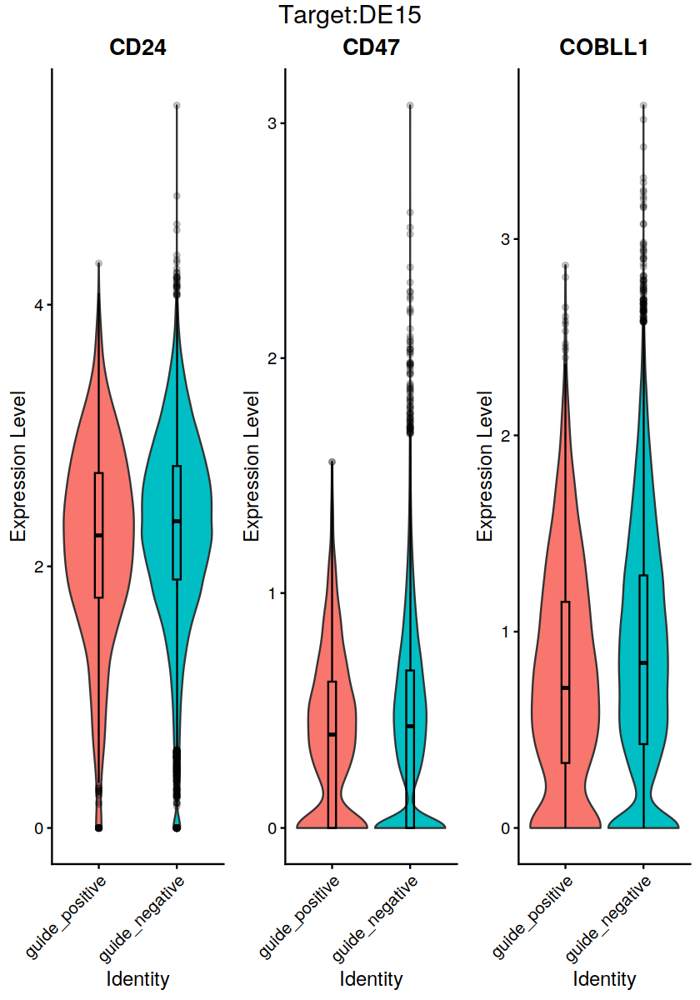

In [ ]:
targets = c("DE6", "DE15")
regulated_genes = c("CD24", "CD47", "COBLL1")


for(i in seq_along(targets)) {
    target = targets[i]
    print(target)
    guides = get_guides_by_subclass(df_guide, 'alias', target)
    seurat_rna <- mark_guide_pos_neg(
        seurat_rna, 
        perturbed_cells_by_guide, 
        guides, 
        print_counts = T
    )

    plots <- VlnPlot(
                    object = seurat_rna,
                    features = regulated_genes, 
                    idents = NULL, 
                    pt.size = 0, 
                    sort = F, 
                    ncol = 3,  
                    combine = F  
        ) 

    for(i in 1:length(plots)) {
        plots[[i]] <- plots[[i]] + 
        NoLegend() +
        geom_boxplot(width=0.1, color="black", alpha=0.2)
    }

    title = paste0("Target:", target)
    plt1 <- ggarrange(plotlist=plots, ncol=3, nrow = 1) 
    plt1 <- annotate_figure(plt1, top = text_grob(title, color = "black", size = 18))  

    print(plt1) 
}



# Debug